## Notebook for Healthy reference epithelial cells data integration and batch correction `scVI`

- **Developed by**: Anna Maguza
- **Institute of Computational Biology - Computational Health Centre - Helmholtz Munich**
- 5th Juni 2023

### Load required modules

In [1]:
import sys
import scvi
import torch
import anndata
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
import seaborn as sns

import numpy as np
import scipy as sp
import pandas as pd
import scanpy as sc
import numpy.random as random


from umap import UMAP
import warnings; warnings.simplefilter('ignore')

import matplotlib.pyplot as plt

Global seed set to 0
/Users/anna.maguza/miniconda3/envs/scvi_env/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/Users/anna.maguza/miniconda3/envs/scvi_env/lib/python3.9/site-packages/flax/struct.py:132: FutureWarning: jax.tree_util.register_keypaths is deprecated, and will be removed in a future release. Please use `register_pytree_with_keys()` instead.
  jax.tree_util.register_keypaths(data_clz, keypaths)
/Users/anna.maguza/miniconda3/envs/scvi_env/lib/python3.9/site-packages/flax/struct.py:132: FutureWarning: jax.tree_util.register_keypaths is deprecated, and will be removed in a future release. Please use `register_pytree_with_keys()` instead.
  jax.tree_util.register_keypaths(data_clz, keypaths)
/Users/anna.maguza/miniconda3/envs/scvi_env/lib/python3.9/site-packages/flax/struct.py:132: FutureWarnin

In [2]:
%matplotlib inline
matplotlib.rcParams["pdf.fonttype"] = 42
matplotlib.rcParams["ps.fonttype"] = 42

In [3]:
torch.cuda.is_available()

False

In [4]:
torch.set_float32_matmul_precision('medium')

In [5]:
sc.settings.verbosity = 3
sc.logging.print_versions()
sc.settings.set_figure_params(dpi = 180, color_map = 'magma_r', dpi_save = 300, vector_friendly = True, format = 'svg')

-----
anndata     0.8.0
scanpy      1.9.3
-----
PIL                         9.4.0
absl                        NA
appnope                     0.1.2
asttokens                   NA
attr                        22.2.0
backcall                    0.2.0
beta_ufunc                  NA
binom_ufunc                 NA
brotli                      NA
certifi                     2022.12.07
cffi                        1.15.1
charset_normalizer          2.1.1
chex                        0.1.6
colorama                    0.4.6
comm                        0.1.2
contextlib2                 NA
cycler                      0.10.0
cython_runtime              NA
dateutil                    2.8.2
debugpy                     1.5.1
decorator                   5.1.1
defusedxml                  0.7.1
docrep                      0.3.2
entrypoints                 0.4
executing                   0.8.3
flax                        0.6.1
fsspec                      2023.3.0
h5py                        3.8.0
hypergeom_uf

In [6]:
arches_params = dict(
    use_layer_norm = "both",
    use_batch_norm = "none",
    encode_covariates = True,
    dropout_rate = 0.2,
    n_layers = 2,
)

In [7]:
def X_is_raw(adata):
    return np.array_equal(adata.X.sum(axis=0).astype(int), adata.X.sum(axis=0))

### Read in datasets

In [39]:
input = '/Users/anna.maguza/Desktop/Data/Processed_datasets/Cancer_dataset_integration/input_files/all_cells/Healthy_epithelial_cells_all_genes.h5ad'
Healthy_adata = sc.read_h5ad(input)

### Filter dataset

In [40]:
Healthy_adata

AnnData object with n_obs × n_vars = 156195 × 18763
    obs: 'Sample_ID', 'Cell Type', 'Study_name', 'Donor_ID', 'Diagnosis', 'Age', 'Region code', 'Fraction', 'Sex', 'Library_Preparation_Protocol', 'batch', 'Age_group', 'Location', 'Cell States', 'Cell States GCA', 'Chem', 'Layer', 'Cell States Kong', 'dataset', 'n_genes_by_counts', 'total_counts', 'total_counts_mito', 'pct_counts_mito', 'total_counts_ribo', 'pct_counts_ribo', 'Cell_ID', '_scvi_batch', '_scvi_labels', 'Unified Cell States', 'doublet_scores', 'predicted_doublets', 'doublet_info'
    var: 'gene_id-0-0-0', 'feature_types-0-0-0', 'gene_id-1-0-0', 'GENE-1-0'

### Extract HVGs

In [41]:
# Save raw counts in raw
Healthy_adata.raw = Healthy_adata

In [42]:
Healthy_adata.layers['counts'] = Healthy_adata.X.copy()

# Calculate 7000 HVGs
sc.pp.highly_variable_genes(
    Healthy_adata,
    flavor = "seurat_v3",
    n_top_genes = 7000,
    layer = "counts",
    batch_key = "Library_Preparation_Protocol",
    subset = True,
    span = 1
)

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)


### Run Integration on GCA dataset

In [72]:
adata = Healthy_adata.copy()
scvi.model.SCVI.setup_anndata(adata, 
                              layer = "counts", 
                              labels_key = "Unified Cell States", 
                              categorical_covariate_keys = ["Sample_ID", 'Study_name', 'Donor_ID'],
                              continuous_covariate_keys = ["n_genes_by_counts", "pct_counts_mito", "pct_counts_ribo"],)

In [73]:
scvi_model = scvi.model.SCVI(adata, n_latent = 50, n_layers = 3, dispersion = 'gene-batch', gene_likelihood = 'nb')

In [74]:
scvi_model.train()

GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Epoch 45/51:  86%|████████▋ | 44/51 [34:46<06:06, 52.29s/it, loss=1.3e+03, v_num=1] 

: 

: 

In [ ]:
adata.obsm["X_scVI"] = scvi_model.get_latent_representation()

In [ ]:
scanvi_model = scvi.model.SCANVI.from_scvi_model(
    scvi_model,
    adata=adata,
    labels_key="Unified Cell States",
    unlabeled_category="Unknown",
)

In [ ]:
scanvi_model.train()

INFO     Training for 10 epochs.                                                                                   


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Epoch 10/10: 100%|██████████| 10/10 [11:54<00:00, 71.35s/it, loss=1.42e+03, v_num=1]

`Trainer.fit` stopped: `max_epochs=10` reached.


Epoch 10/10: 100%|██████████| 10/10 [11:54<00:00, 71.50s/it, loss=1.42e+03, v_num=1]


In [ ]:
adata.obsm["X_scANVI"] = scanvi_model.get_latent_representation(adata)

In [ ]:
# Save the results
adata.write('/Users/anna.maguza/Desktop/Data/Processed_datasets/Cancer_dataset_integration/Datasets integration/healthy_epithelial/Integrated_Healthy_epithelial_datasets_7000_4.h5ad')

In [ ]:
sc.pp.neighbors(adata, use_rep = "X_scVI", n_neighbors = 50, metric = 'minkowski')

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:27)


In [ ]:
sc.tl.umap(adata, min_dist = 0.4, spread = 4, random_state = 1712)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:01:38)


In [ ]:
# Save the results
adata.write('/Users/anna.maguza/Desktop/Data/Processed_datasets/Cancer_dataset_integration/Datasets integration/healthy_epithelial/Integrated_Healthy_epithelial_datasets_7000_4.h5ad')

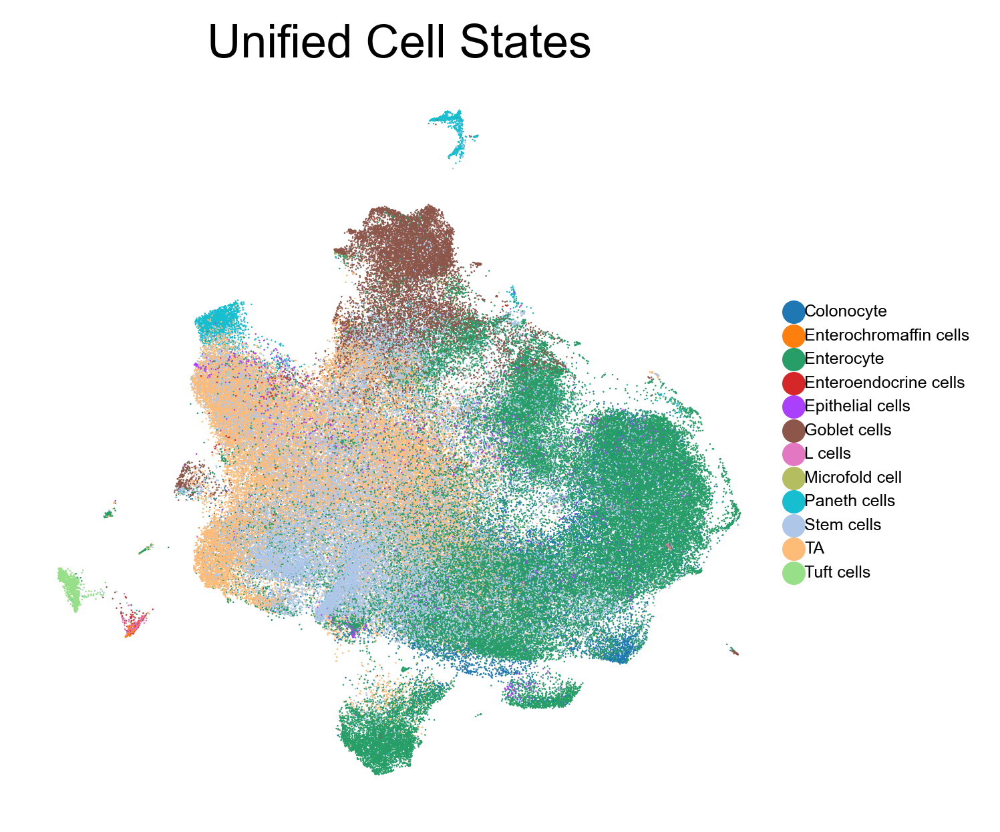

In [ ]:
sc.pl.umap(adata, frameon = False, color = ['Unified Cell States'], size = 1, legend_fontsize = 5, ncols = 3)

In [70]:
adata

AnnData object with n_obs × n_vars = 156195 × 7000
    obs: 'Sample_ID', 'Cell Type', 'Study_name', 'Donor_ID', 'Diagnosis', 'Age', 'Region code', 'Fraction', 'Sex', 'Library_Preparation_Protocol', 'batch', 'Age_group', 'Location', 'Cell States', 'Cell States GCA', 'Chem', 'Layer', 'Cell States Kong', 'dataset', 'n_genes_by_counts', 'total_counts', 'total_counts_mito', 'pct_counts_mito', 'total_counts_ribo', 'pct_counts_ribo', 'Cell_ID', '_scvi_batch', '_scvi_labels', 'Unified Cell States', 'doublet_scores', 'predicted_doublets', 'doublet_info'
    var: 'gene_id-0-0-0', 'feature_types-0-0-0', 'gene_id-1-0-0', 'GENE-1-0', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: 'hvg', '_scvi_uuid', '_scvi_manager_uuid', 'neighbors', 'umap', 'Unified Cell States_colors'
    obsm: '_scvi_extra_categorical_covs', '_scvi_extra_continuous_covs', 'X_scVI', 'X_scANVI', 'X_umap'
    layers: 'counts'
    obsp: 'distances', 'connectivi

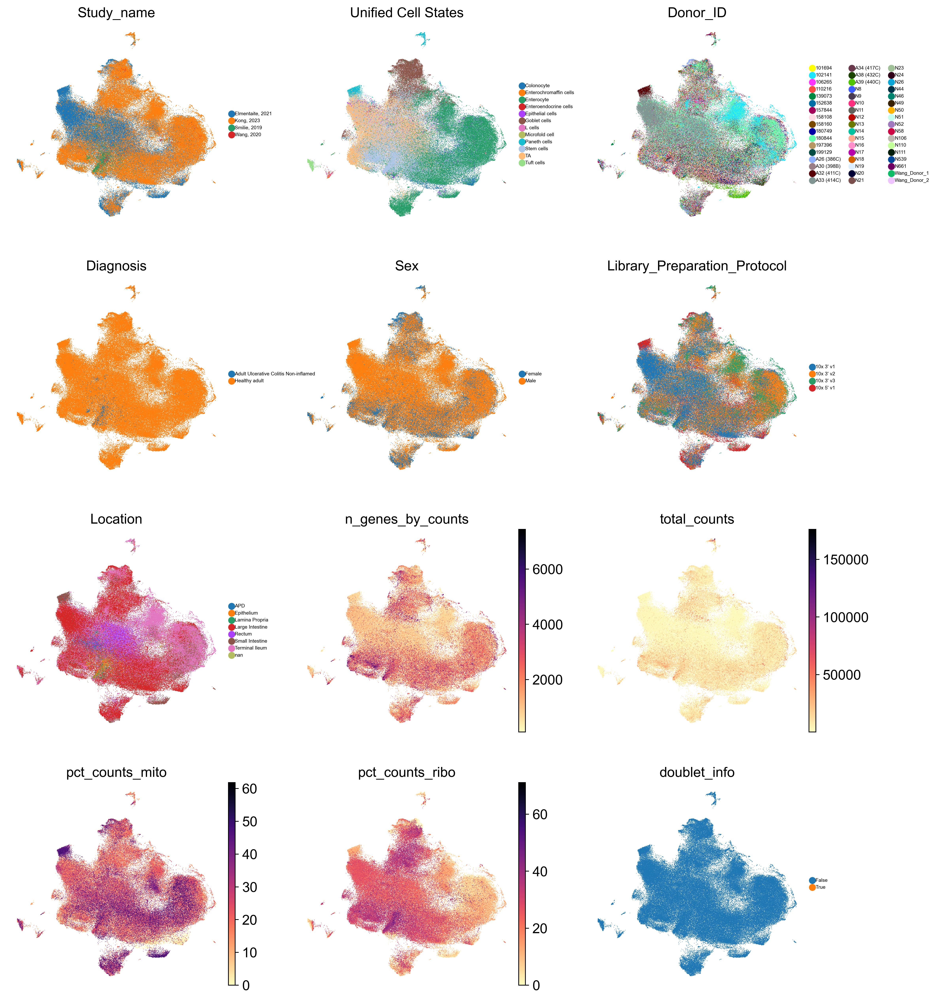

In [71]:
sc.pl.umap(adata, frameon = False, color = ['Study_name', 'Unified Cell States', 'Donor_ID', 'Diagnosis', 'Sex', 'Library_Preparation_Protocol', 'Location', 'n_genes_by_counts', 'total_counts', 'pct_counts_mito', 'pct_counts_ribo', 'doublet_info'], size = 1, legend_fontsize = 5, ncols = 3)